In [1]:
import sys
sys.path.insert(1, '../')

In [2]:
import joblib
import pickle

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from functions.data import load_dataset
from functions.data import DATASETS_LS as datasets
from functions.analysis import create_df, create_fold_df
from functions.statistical_tests import apply_friedman_test, apply_nemenyi_test
from functions.plotting import compute_ylim, add_significance_bars


In [3]:
import warnings
warnings.filterwarnings("ignore", message="X does not have valid feature names")
warnings.filterwarnings("ignore", message="The total space of parameters")
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)


## Load results

In [4]:
# baseline ensembles, no resampling (notebook 01-analysis-of-ensembles)
with open('../models/ensembles/results', 'rb') as f:
    scores_baseline = pickle.load(f)

with open('../models/ensembles/results_folds', 'rb') as f:
    folds_baseline = pickle.load(f)

# same ensembles trained after Random Undersampling (RUS)
with open('../models/rus/results', 'rb') as f:
    scores_rus = pickle.load(f)

with open('../models/rus/results_folds', 'rb') as f:
    folds_rus = pickle.load(f)

# combine baseline and RUS results into a single comparison
scores_dict = {
    dataset: {**scores_baseline[dataset], **scores_rus[dataset]}
    for dataset in scores_baseline
}

folds_dict = {
    dataset: {**folds_baseline[dataset], **folds_rus[dataset]}
    for dataset in folds_baseline
}


In [5]:
# each baseline model is immediately followed by its RUS counterpart,
# so paired bars are easy to compare in the plots below
models = [
    "rf", "rf_rus", "ada", "ada_rus", "gbm", "gbm_rus", "cat", "cat_rus", "lgbm", "lgbm_rus", "xgb", "xgb_rus",
]

MODEL_DIRS = {}
for base in ['rf', 'ada', 'gbm', 'cat', 'lgbm', 'xgb']:
    MODEL_DIRS[base] = "../models/ensembles"
    MODEL_DIRS[f"{base}_rus"] = "../models/rus"


In [6]:
# test function
df = create_df(scores_dict, "oil", models)
df

,roc,roc_std,ap,ap_std,precision,precision_std,recall,recall_std,f1_score,f1_std,mcc,mcc_std,ba,ba_std,brier,brier_std,gmean,gmean_std,thresh,tresh_std
rf,0.954913,0.022165,0.611664,0.097060,0.722500,0.161924,0.703788,0.122399,0.687619,0.041360,0.682910,0.044886,0.926913,0.033283,0.037129,0.011183,0.926353,0.033319,0.206481,0.038896
rf_rus,0.944803,0.010928,0.551554,0.108511,0.741667,0.152550,0.613384,0.084294,0.658627,0.063301,0.650831,0.069504,0.909732,0.020872,0.124997,0.001475,0.905663,0.022640,0.827555,0.010644
ada,0.975267,0.006724,0.712369,0.103320,0.811111,0.118374,0.712121,0.038030,0.755938,0.067371,0.749647,0.071642,0.957554,0.003664,0.167357,0.002936,0.956605,0.003832,0.493193,0.011129
ada_rus,0.927986,0.016555,0.432637,0.132232,0.474328,0.136384,0.724747,0.181256,0.542117,0.099532,0.543324,0.085465,0.885728,0.034158,0.185929,0.002116,0.883081,0.034701,0.567387,0.030090
gbm,0.970079,0.006198,0.709911,0.093447,0.854978,0.125407,0.646717,0.063174,0.732781,0.074312,0.728965,0.082739,0.944409,0.012350,0.030416,0.007570,0.942680,0.013109,0.647669,0.387881
gbm_rus,0.928989,0.006749,0.507389,0.066423,0.653968,0.117782,0.543687,0.060298,0.582272,0.028049,0.573266,0.031329,0.905218,0.012997,0.159772,0.015929,0.900125,0.014535,0.999995,0.000006
cat,0.965166,0.003736,0.729943,0.057918,0.852137,0.169602,0.696717,0.108716,0.746032,0.072392,0.748130,0.074906,0.933012,0.011904,0.027421,0.008653,0.931585,0.011854,0.541895,0.301408
cat_rus,0.961260,0.012297,0.659462,0.130793,0.795513,0.128083,0.627273,0.123687,0.688321,0.076718,0.685394,0.076924,0.923856,0.023331,0.113572,0.011983,0.920364,0.025309,0.994087,0.004321
lgbm,0.938354,0.018582,0.689647,0.083522,0.845238,0.140052,0.688384,0.079673,0.748779,0.067107,0.744900,0.074590,0.917043,0.023256,0.029256,0.011446,0.914585,0.026115,0.438034,0.367620
lgbm_rus,0.890857,0.029335,0.492885,0.042794,0.607692,0.196719,0.511869,0.073509,0.530702,0.020582,0.522077,0.042458,0.850783,0.022531,0.167098,0.027483,0.839256,0.028257,0.999484,0.000530


## Datasets

In [7]:
len(datasets)

37

## Probability distribution

For each dataset, we compare the predicted probability of the positive class for
each of the 6 ensembles trained without resampling (**top row** of each pair)
against the same ensembles trained after Random Undersampling (**bottom row**,
labelled `RUS`). Undersampling shifts the decision boundary towards the minority
class, so we expect the RUS row to show probabilities pushed further away from 0
for the same observations.

In [8]:
# For each dataset: row 1 = baseline (no resampling), row 2 = RUS.
# Figure height is intentionally large (2 rows per dataset x 37 datasets),
# so we save at a modest dpi to keep the file size manageable.
n_datasets = len(datasets)
n_estimators = len(['rf', 'ada', 'gbm', 'cat', 'lgbm', 'xgb'])

fig, axes = plt.subplots(2 * n_datasets, n_estimators,
                         figsize=(4 * n_estimators, 3 * 2 * n_datasets))

for i, dataset in enumerate(datasets):
    _, X_test, _, y_test = load_dataset(dataset)

    for j, estimator in enumerate(['rf', 'ada', 'gbm', 'cat', 'lgbm', 'xgb']):
        for row_offset, model in enumerate([estimator, f"{estimator}_rus"]):
            search = joblib.load(f"{MODEL_DIRS[model]}/{dataset}_{model}.pkl")
            probs = search.predict_proba(X_test)[:, 1]

            ax = axes[2 * i + row_offset, j]
            ax.hist(probs, bins=30, density=True, color="steelblue")
            ax.set_xlim(0, 1)
            stats_text = (
                f"min={probs.min():.2f}\n"
                f"max={probs.max():.2f}\n"
                f"mean={probs.mean():.2f}\n"
                f"p75={np.percentile(probs, 75):.2f}\n"
                f"p25={np.percentile(probs, 25):.2f}"
            )
            ax.text(0.97, 0.97, stats_text,
                    transform=ax.transAxes,
                    fontsize=7,
                    verticalalignment="top",
                    horizontalalignment="right",
                    bbox=dict(boxstyle="round,pad=0.3", facecolor="white", edgecolor="gray", alpha=0.8))
            ax.set_title(f"{dataset}\n{model}", fontsize=9)

            if j == 0:
                ax.set_ylabel("Density", fontsize=9)
            if row_offset == 1:
                ax.set_xlabel("P(class = 1)", fontsize=9)

plt.suptitle("Predicted Probability of Class 1: baseline (top) vs RUS (bottom)", fontsize=14, y=1.005)
plt.tight_layout()
plt.savefig('../figures/rus_prob_dist.png', dpi=100, bbox_inches='tight')
plt.show()


## Training speed

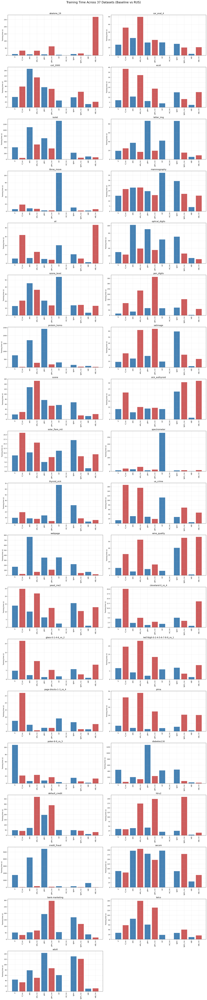

In [9]:
# Create figure with 37 subplots
fig, axes = plt.subplots(nrows=19, ncols=2, figsize=(20, 95))  # 19x2 grid for 37 plots (with 1 empty)
axes = axes.ravel()  # Flatten for easy iteration

# Loop through each dataset
for i, data in enumerate(datasets):
    ax = axes[i]

    # collect training time (with hyperparameter tuning) per model
    fit_times = []
    for estimator in models:
        search = joblib.load(f"{MODEL_DIRS[estimator]}/{data}_{estimator}.pkl")
        # CatBoost silently drops post-hoc attributes (like fit_time) when
        # pickled, so cat_rus reports NaN here rather than crashing the loop
        fit_times.append(getattr(search, "fit_time", np.nan))

    colors = ["steelblue" if not m.endswith("_rus") else "indianred" for m in models]
    ax.bar(models, fit_times, color=colors)

    # Customize subplot
    ax.set_title(data, fontsize=14)
    ax.set_ylabel("Training time (s)", fontsize=10)
    ax.tick_params(axis='x', rotation=90, labelsize=10)
    ax.grid(True, alpha=0.3)

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.suptitle(f'Training Time Across {len(datasets)} Datasets (Baseline vs RUS)', fontsize=20, y=1.01)
plt.savefig('../figures/rus_training_time.png', dpi=300, bbox_inches='tight')
plt.show()


## ROC-AUC Friedman test

In [10]:
friedman_rows = []
nemenyi_dict = {}

for data in datasets:
    df = create_fold_df(folds_dict, data, "roc")
    statistic, pvalue = apply_friedman_test(df)
    friedman_rows.append({"dataset": data, "statistic": statistic, "pvalue": pvalue})

    # follow up with Nemenyi post-hoc test only when Friedman is significant
    if pvalue < 0.05:
        nemenyi_dict[data] = apply_nemenyi_test(df)

friedman_df = pd.DataFrame(friedman_rows).set_index("dataset")
friedman_df

,statistic,pvalue
dataset,,
abalone_19,36.446154,1.426192e-04
car_eval_4,44.261710,6.539291e-06
coil_2000,27.769231,3.511397e-03
ecoli,37.292872,1.029078e-04
isolet,51.738462,3.040523e-07
letter_img,52.228831,2.478139e-07
libras_move,37.896877,8.143403e-05
mammography,32.107692,7.329615e-04
oil,40.097271,3.443026e-05


## Plot ROC-AUC

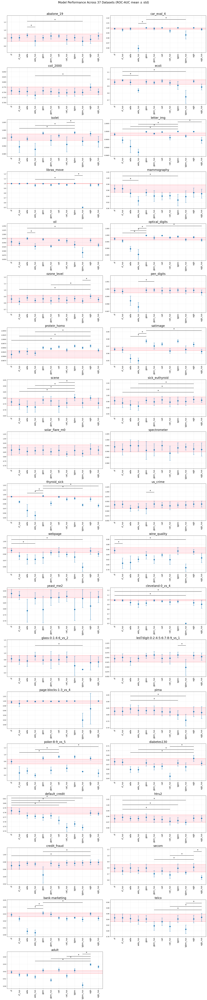

In [11]:
# Create figure with 37 subplots
fig, axes = plt.subplots(nrows=19, ncols=2, figsize=(20, 95))  # 19x2 grid for 37 plots (with 1 empty)
axes = axes.ravel()  # Flatten for easy iteration

# Loop through each DataFrame
for i, data in enumerate(datasets):
    df = create_df(scores_dict, data, models)
    
    ax = axes[i]
    
    # Extract data
    cls = df.index
    means = df.iloc[:, 0]
    stds = df.iloc[:, 1]

    upper = df.iloc[0, 0] + df.iloc[0, 1]
    lower = df.iloc[0, 0] - df.iloc[0, 1]

    # Determine significant comparisons (if any) up front, so we can
    # reserve extra headroom above the data for the significance bars
    best_model = None
    sig_models = []
    if data in nemenyi_dict:
        best_model = means.idxmax()
        posthoc = nemenyi_dict[data]
        sig_models = [
            m for m in models
            if m != best_model and posthoc.loc[best_model, m] < 0.05
        ]

    # Create errorbar plot
    ax.errorbar(x=cls, y=means, yerr=stds,
                fmt='o', capsize=5, markersize=8)

    # Customize subplot
    ax.set_title(data, fontsize=20)
    ylims = compute_ylim(means, stds, upper, lower)
    if sig_models:
        # reserve headroom above the data for the significance bars
        y0, y1 = ylims
        ylims = (y0, y1 + (y1 - y0) * 0.4)
    ax.set_ylim(ylims)
    ax.tick_params(axis='x', rotation=90, labelsize=14)
    ax.grid(True, alpha=0.3)

    # Add horizontal lines at baseline RF error bars
    ax.axhline(y=upper, color='r', linestyle='--', alpha=0.5)
    ax.axhline(y=lower, color='r', linestyle='--', alpha=0.5)

    # Color area between RF error bars
    ax.axhspan(ymin=lower, ymax=upper, facecolor='pink', alpha=0.3)

    # If the Friedman test was significant, draw Nemenyi significance bars
    # from the best performing model to each model significantly worse than it
    if sig_models:
        data_max = (means + stds).max()
        add_significance_bars(ax, models, data_max, best_model, sig_models)

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.suptitle(f'Model Performance Across {len(datasets)} Datasets (ROC-AUC mean ± std)', fontsize=20, y=1.01)
plt.savefig('../figures/rus_rocauc.png', dpi=300, bbox_inches='tight')
plt.show()

## Average Precision Friedman test

In [12]:
friedman_rows = []
nemenyi_dict_ap = {}

for data in datasets:
    df = create_fold_df(folds_dict, data, "ap")
    statistic, pvalue = apply_friedman_test(df)
    friedman_rows.append({"dataset": data, "statistic": statistic, "pvalue": pvalue})

    # follow up with Nemenyi post-hoc test only when Friedman is significant
    if pvalue < 0.05:
        nemenyi_dict_ap[data] = apply_nemenyi_test(df)

friedman_df_ap = pd.DataFrame(friedman_rows).set_index("dataset")
friedman_df_ap

,statistic,pvalue
dataset,,
abalone_19,38.938462,5.426431e-05
car_eval_4,46.349845,2.804041e-06
coil_2000,25.892308,6.733629e-03
ecoli,28.944484,2.315415e-03
isolet,52.876923,1.890137e-07
letter_img,52.230769,2.476135e-07
libras_move,36.529670,1.381143e-04
mammography,51.000000,4.134337e-07
oil,35.523077,2.030689e-04


## Plot average precision

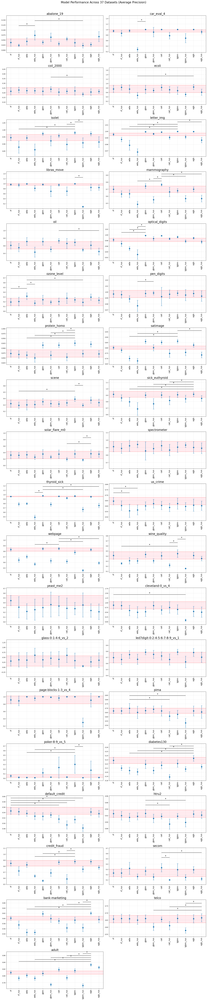

In [13]:
# Create figure with 37 subplots
fig, axes = plt.subplots(nrows=19, ncols=2, figsize=(20, 95))  # 19x2 grid for 37 plots (with 1 empty)
axes = axes.ravel()  # Flatten for easy iteration

# Loop through each DataFrame
for i, data in enumerate(datasets):
    df = create_df(scores_dict, data, models)
    
    ax = axes[i]
    
    # Extract data
    cls = df.index
    means = df.iloc[:, 2]
    stds = df.iloc[:, 3]

    upper = df.iloc[0, 2] + df.iloc[0, 3]
    lower = df.iloc[0, 2] - df.iloc[0, 3]

    # Determine significant comparisons (if any) up front, so we can
    # reserve extra headroom above the data for the significance bars
    best_model = None
    sig_models = []
    if data in nemenyi_dict_ap:
        best_model = means.idxmax()
        posthoc = nemenyi_dict_ap[data]
        sig_models = [
            m for m in models
            if m != best_model and posthoc.loc[best_model, m] < 0.05
        ]

    # Create errorbar plot
    ax.errorbar(x=cls, y=means, yerr=stds,
                fmt='o', capsize=5, markersize=8)

    # Customize subplot
    ax.set_title(data, fontsize=20)
    ylims = compute_ylim(means, stds, upper, lower)
    if sig_models:
        # reserve headroom above the data for the significance bars
        y0, y1 = ylims
        ylims = (y0, y1 + (y1 - y0) * 0.4)
    ax.set_ylim(ylims)
    ax.tick_params(axis='x', rotation=90, labelsize=14)
    ax.grid(True, alpha=0.3)

    # Add horizontal lines at baseline RF error bars
    ax.axhline(y=upper, color='r', linestyle='--', alpha=0.5)
    ax.axhline(y=lower, color='r', linestyle='--', alpha=0.5)

    # Color area between RF error bars
    ax.axhspan(ymin=lower, ymax=upper, facecolor='pink', alpha=0.3)

    # If the Friedman test was significant, draw Nemenyi significance bars
    # from the best performing model to each model significantly worse than it
    if sig_models:
        data_max = (means + stds).max()
        add_significance_bars(ax, models, data_max, best_model, sig_models)

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.suptitle(f'Model Performance Across {len(datasets)} Datasets (Average Precision)', fontsize=20, y=1.01)
plt.savefig('../figures/rus_ap.png', dpi=300, bbox_inches='tight')
plt.show()

## Recall Friedman test

In [14]:
friedman_rows = []
nemenyi_dict_recall = {}

for data in datasets:
    df = create_fold_df(folds_dict, data, "recall")
    statistic, pvalue = apply_friedman_test(df)
    friedman_rows.append({"dataset": data, "statistic": statistic, "pvalue": pvalue})

    # follow up with Nemenyi post-hoc test only when Friedman is significant
    if pvalue < 0.05:
        nemenyi_dict_recall[data] = apply_nemenyi_test(df)

friedman_df_recall = pd.DataFrame(friedman_rows).set_index("dataset")
friedman_df_recall

,statistic,pvalue
dataset,,
abalone_19,9.921007,0.537506
car_eval_4,12.567757,0.322512
coil_2000,18.666667,0.067346
ecoli,40.032176,0.000035
isolet,44.614134,0.000006
letter_img,42.888808,0.000011
libras_move,22.469246,0.020980
mammography,22.880000,0.018377
oil,20.197295,0.042707


## Plot Recall

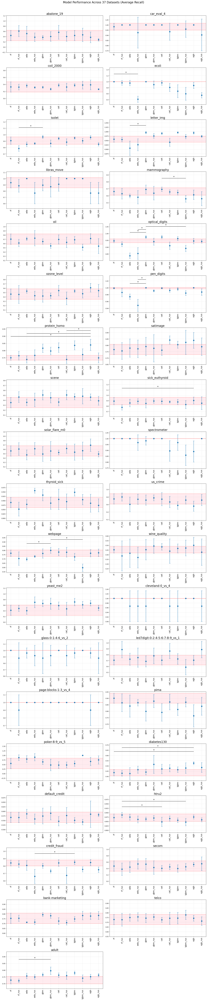

In [15]:
# Create figure with 37 subplots
fig, axes = plt.subplots(nrows=19, ncols=2, figsize=(20, 95))  # 19x2 grid for 37 plots (with 1 empty)
axes = axes.ravel()  # Flatten for easy iteration

# Loop through each DataFrame
for i, data in enumerate(datasets):
    df = create_df(scores_dict, data, models)
    
    ax = axes[i]
    
    # Extract data
    cls = df.index
    means = df.iloc[:, 6]
    stds = df.iloc[:, 7]

    upper = df.iloc[0, 6] + df.iloc[0, 7]
    lower = df.iloc[0, 6] - df.iloc[0, 7]

    # Determine significant comparisons (if any) up front, so we can
    # reserve extra headroom above the data for the significance bars
    best_model = None
    sig_models = []
    if data in nemenyi_dict_recall:
        best_model = means.idxmax()
        posthoc = nemenyi_dict_recall[data]
        sig_models = [
            m for m in models
            if m != best_model and posthoc.loc[best_model, m] < 0.05
        ]

    # Create errorbar plot
    ax.errorbar(x=cls, y=means, yerr=stds,
                fmt='o', capsize=5, markersize=8)

    # Customize subplot
    ax.set_title(data, fontsize=20)
    ylims = compute_ylim(means, stds, upper, lower)
    if sig_models:
        # reserve headroom above the data for the significance bars
        y0, y1 = ylims
        ylims = (y0, y1 + (y1 - y0) * 0.4)
    ax.set_ylim(ylims)
    ax.tick_params(axis='x', rotation=90, labelsize=14)
    ax.grid(True, alpha=0.3)

    # Add horizontal lines at baseline RF error bars
    ax.axhline(y=upper, color='r', linestyle='--', alpha=0.5)
    ax.axhline(y=lower, color='r', linestyle='--', alpha=0.5)

    # Color area between RF error bars
    ax.axhspan(ymin=lower, ymax=upper, facecolor='pink', alpha=0.3)

    # If the Friedman test was significant, draw Nemenyi significance bars
    # from the best performing model to each model significantly worse than it
    if sig_models:
        data_max = (means + stds).max()
        add_significance_bars(ax, models, data_max, best_model, sig_models)

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.suptitle(f'Model Performance Across {len(datasets)} Datasets (Average Recall)', fontsize=20, y=1.01)
plt.savefig('../figures/rus_recall.png', dpi=300, bbox_inches='tight')
plt.show()

## F1-score Friedman test

In [16]:
friedman_rows = []
nemenyi_dict_f1 = {}

for data in datasets:
    df = create_fold_df(folds_dict, data, "f1")
    statistic, pvalue = apply_friedman_test(df)
    friedman_rows.append({"dataset": data, "statistic": statistic, "pvalue": pvalue})

    # follow up with Nemenyi post-hoc test only when Friedman is significant
    if pvalue < 0.05:
        nemenyi_dict_f1[data] = apply_nemenyi_test(df)

friedman_df_f1 = pd.DataFrame(friedman_rows).set_index("dataset")
friedman_df_f1

,statistic,pvalue
dataset,,
abalone_19,34.765242,2.708851e-04
car_eval_4,48.093823,1.373714e-06
coil_2000,33.184745,4.910885e-04
ecoli,27.395007,4.003805e-03
isolet,48.626312,1.103590e-06
letter_img,49.063247,9.217724e-07
libras_move,30.784839,1.191590e-03
mammography,50.073478,6.071855e-07
oil,41.039683,2.372440e-05


## Plot f1-score

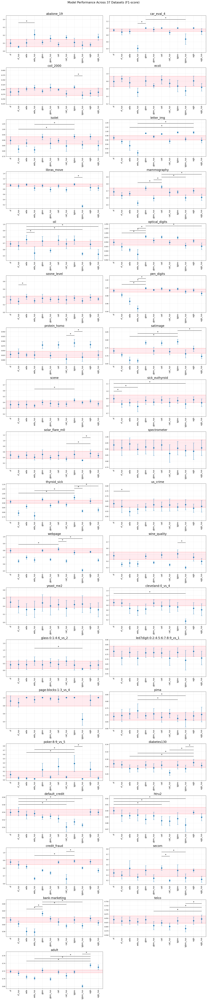

In [17]:
# Create figure with 37 subplots
fig, axes = plt.subplots(nrows=19, ncols=2, figsize=(20, 95))  # 19x2 grid for 37 plots (with 1 empty)
axes = axes.ravel()  # Flatten for easy iteration

# Loop through each DataFrame
for i, data in enumerate(datasets):
    df = create_df(scores_dict, data, models)
    
    ax = axes[i]
    
    # Extract data
    cls = df.index
    means = df.iloc[:, 8]
    stds = df.iloc[:, 9]

    upper = df.iloc[0, 8] + df.iloc[0, 9]
    lower = df.iloc[0, 8] - df.iloc[0, 9]

    # Determine significant comparisons (if any) up front, so we can
    # reserve extra headroom above the data for the significance bars
    best_model = None
    sig_models = []
    if data in nemenyi_dict_f1:
        best_model = means.idxmax()
        posthoc = nemenyi_dict_f1[data]
        sig_models = [
            m for m in models
            if m != best_model and posthoc.loc[best_model, m] < 0.05
        ]

    # Create errorbar plot
    ax.errorbar(x=cls, y=means, yerr=stds,
                fmt='o', capsize=5, markersize=8)

    # Customize subplot
    ax.set_title(data, fontsize=20)
    ylims = compute_ylim(means, stds, upper, lower)
    if sig_models:
        # reserve headroom above the data for the significance bars
        y0, y1 = ylims
        ylims = (y0, y1 + (y1 - y0) * 0.4)
    ax.set_ylim(ylims)
    ax.tick_params(axis='x', rotation=90, labelsize=14)
    ax.grid(True, alpha=0.3)

    # Add horizontal lines at baseline RF error bars
    ax.axhline(y=upper, color='r', linestyle='--', alpha=0.5)
    ax.axhline(y=lower, color='r', linestyle='--', alpha=0.5)

    # Color area between RF error bars
    ax.axhspan(ymin=lower, ymax=upper, facecolor='pink', alpha=0.3)

    # If the Friedman test was significant, draw Nemenyi significance bars
    # from the best performing model to each model significantly worse than it
    if sig_models:
        data_max = (means + stds).max()
        add_significance_bars(ax, models, data_max, best_model, sig_models)

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.suptitle(f'Model Performance Across {len(datasets)} Datasets (F1-score)', fontsize=20, y=1.01)
plt.savefig('../figures/rus_f1-score.png', dpi=300, bbox_inches='tight')
plt.show()

## MCC Friedman test

In [18]:
friedman_rows = []
nemenyi_dict_mcc = {}

for data in datasets:
    df = create_fold_df(folds_dict, data, "mcc")
    statistic, pvalue = apply_friedman_test(df)
    friedman_rows.append({"dataset": data, "statistic": statistic, "pvalue": pvalue})

    # follow up with Nemenyi post-hoc test only when Friedman is significant
    if pvalue < 0.05:
        nemenyi_dict_mcc[data] = apply_nemenyi_test(df)

friedman_df_mcc = pd.DataFrame(friedman_rows).set_index("dataset")
friedman_df_mcc

,statistic,pvalue
dataset,,
abalone_19,35.079832,2.403987e-04
car_eval_4,48.093823,1.373714e-06
coil_2000,28.242827,2.971227e-03
ecoli,29.164630,2.140174e-03
isolet,49.426872,7.933235e-07
letter_img,49.063247,9.217724e-07
libras_move,30.744453,1.209271e-03
mammography,49.962185,6.358149e-07
oil,39.171306,4.953753e-05


## Plot MCC

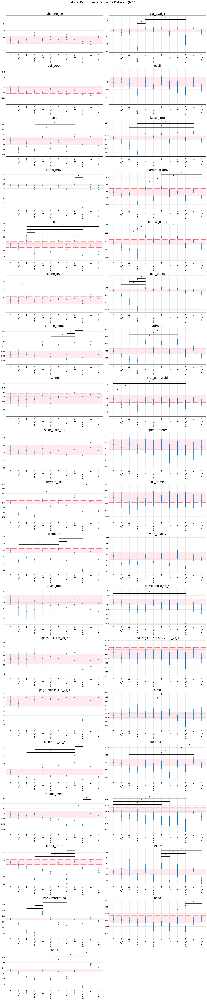

In [19]:
# Create figure with 37 subplots
fig, axes = plt.subplots(nrows=19, ncols=2, figsize=(20, 95))  # 19x2 grid for 37 plots (with 1 empty)
axes = axes.ravel()  # Flatten for easy iteration

# Loop through each DataFrame
for i, data in enumerate(datasets):
    df = create_df(scores_dict, data, models)
    
    ax = axes[i]
    
    # Extract data
    cls = df.index
    means = df.iloc[:, 10]
    stds = df.iloc[:, 11]

    upper = df.iloc[0, 10] + df.iloc[0, 11]
    lower = df.iloc[0, 10] - df.iloc[0, 11]

    # Determine significant comparisons (if any) up front, so we can
    # reserve extra headroom above the data for the significance bars
    best_model = None
    sig_models = []
    if data in nemenyi_dict_mcc:
        best_model = means.idxmax()
        posthoc = nemenyi_dict_mcc[data]
        sig_models = [
            m for m in models
            if m != best_model and posthoc.loc[best_model, m] < 0.05
        ]

    # Create errorbar plot
    ax.errorbar(x=cls, y=means, yerr=stds,
                fmt='o', capsize=5, markersize=8)

    # Customize subplot
    ax.set_title(data, fontsize=20)
    ylims = compute_ylim(means, stds, upper, lower)
    if sig_models:
        # reserve headroom above the data for the significance bars
        y0, y1 = ylims
        ylims = (y0, y1 + (y1 - y0) * 0.4)
    ax.set_ylim(ylims)
    ax.tick_params(axis='x', rotation=90, labelsize=14)
    ax.grid(True, alpha=0.3)

    # Add horizontal lines at baseline RF error bars
    ax.axhline(y=upper, color='r', linestyle='--', alpha=0.5)
    ax.axhline(y=lower, color='r', linestyle='--', alpha=0.5)

    # Color area between RF error bars
    ax.axhspan(ymin=lower, ymax=upper, facecolor='pink', alpha=0.3)

    # If the Friedman test was significant, draw Nemenyi significance bars
    # from the best performing model to each model significantly worse than it
    if sig_models:
        data_max = (means + stds).max()
        add_significance_bars(ax, models, data_max, best_model, sig_models)

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.suptitle(f'Model Performance Across {len(datasets)} Datasets (MCC)', fontsize=20, y=1.01)
plt.savefig('../figures/rus_mcc.png', dpi=300, bbox_inches='tight')
plt.show()

## Balanced Accuracy Friedman test

In [20]:
friedman_rows = []
nemenyi_dict_ba = {}

for data in datasets:
    df = create_fold_df(folds_dict, data, "ba")
    statistic, pvalue = apply_friedman_test(df)
    friedman_rows.append({"dataset": data, "statistic": statistic, "pvalue": pvalue})

    # follow up with Nemenyi post-hoc test only when Friedman is significant
    if pvalue < 0.05:
        nemenyi_dict_ba[data] = apply_nemenyi_test(df)

friedman_df_ba = pd.DataFrame(friedman_rows).set_index("dataset")
friedman_df_ba

,statistic,pvalue
dataset,,
abalone_19,34.354794,3.163957e-04
car_eval_4,48.253333,1.286573e-06
coil_2000,29.412876,1.957923e-03
ecoli,41.652487,1.860065e-05
isolet,48.780266,1.035800e-06
letter_img,51.022425,4.095988e-07
libras_move,34.282108,3.251992e-04
mammography,33.430769,4.479003e-04
oil,32.467368,6.415096e-04


## Balanced accuracy

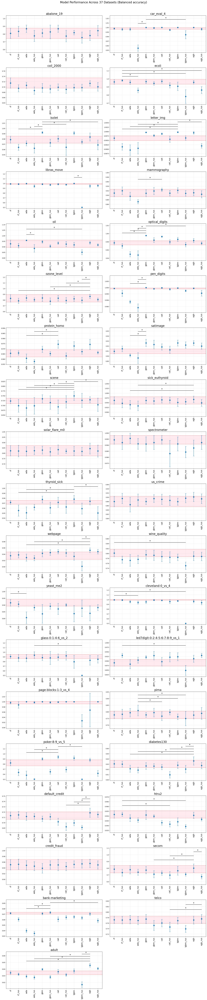

In [21]:
# Create figure with 37 subplots
fig, axes = plt.subplots(nrows=19, ncols=2, figsize=(20, 95))  # 19x2 grid for 37 plots (with 1 empty)
axes = axes.ravel()  # Flatten for easy iteration

# Loop through each DataFrame
for i, data in enumerate(datasets):
    df = create_df(scores_dict, data, models)
    
    ax = axes[i]
    
    # Extract data
    cls = df.index
    means = df.iloc[:, 12]
    stds = df.iloc[:, 13]

    upper = df.iloc[0, 12] + df.iloc[0, 13]
    lower = df.iloc[0, 12] - df.iloc[0, 13]

    # Determine significant comparisons (if any) up front, so we can
    # reserve extra headroom above the data for the significance bars
    best_model = None
    sig_models = []
    if data in nemenyi_dict_ba:
        best_model = means.idxmax()
        posthoc = nemenyi_dict_ba[data]
        sig_models = [
            m for m in models
            if m != best_model and posthoc.loc[best_model, m] < 0.05
        ]

    # Create errorbar plot
    ax.errorbar(x=cls, y=means, yerr=stds,
                fmt='o', capsize=5, markersize=8)

    # Customize subplot
    ax.set_title(data, fontsize=20)
    ylims = compute_ylim(means, stds, upper, lower)
    if sig_models:
        # reserve headroom above the data for the significance bars
        y0, y1 = ylims
        ylims = (y0, y1 + (y1 - y0) * 0.4)
    ax.set_ylim(ylims)
    ax.tick_params(axis='x', rotation=90, labelsize=14)
    ax.grid(True, alpha=0.3)

    # Add horizontal lines at baseline RF error bars
    ax.axhline(y=upper, color='r', linestyle='--', alpha=0.5)
    ax.axhline(y=lower, color='r', linestyle='--', alpha=0.5)

    # Color area between RF error bars
    ax.axhspan(ymin=lower, ymax=upper, facecolor='pink', alpha=0.3)

    # If the Friedman test was significant, draw Nemenyi significance bars
    # from the best performing model to each model significantly worse than it
    if sig_models:
        data_max = (means + stds).max()
        add_significance_bars(ax, models, data_max, best_model, sig_models)

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.suptitle(f'Model Performance Across {len(datasets)} Datasets (Balanced accuracy)', fontsize=20, y=1.01)
plt.savefig('../figures/rus_balanced_acc.png', dpi=300, bbox_inches='tight')
plt.show()

## Brier Score Friedman test

In [22]:
friedman_rows = []
nemenyi_dict_brier = {}

for data in datasets:
    df = create_fold_df(folds_dict, data, "brier")
    statistic, pvalue = apply_friedman_test(df)
    friedman_rows.append({"dataset": data, "statistic": statistic, "pvalue": pvalue})

    # follow up with Nemenyi post-hoc test only when Friedman is significant
    if pvalue < 0.05:
        nemenyi_dict_brier[data] = apply_nemenyi_test(df)

friedman_df_brier = pd.DataFrame(friedman_rows).set_index("dataset")
friedman_df_brier

,statistic,pvalue
dataset,,
abalone_19,54.015385,1.172763e-07
car_eval_4,54.076923,1.142833e-07
coil_2000,51.923077,2.815314e-07
ecoli,50.015385,6.219666e-07
isolet,54.630769,9.053824e-08
letter_img,54.507692,9.535117e-08
libras_move,51.800000,2.963537e-07
mammography,54.446154,9.785197e-08
oil,50.753846,4.579407e-07


## Brier score

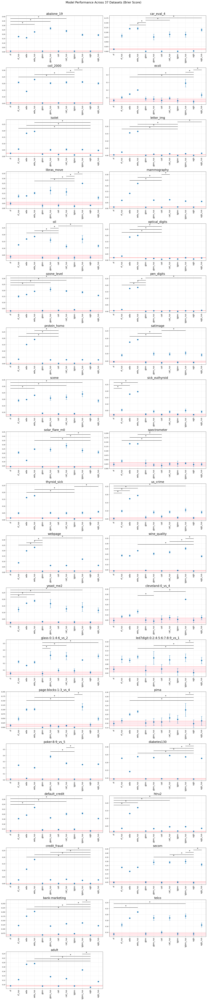

In [23]:
# Create figure with 37 subplots
fig, axes = plt.subplots(nrows=19, ncols=2, figsize=(20, 95))  # 19x2 grid for 37 plots (with 1 empty)
axes = axes.ravel()  # Flatten for easy iteration

# Loop through each DataFrame
for i, data in enumerate(datasets):
    df = create_df(scores_dict, data, models)
    
    ax = axes[i]
    
    # Extract data
    cls = df.index
    means = df.iloc[:, 14]
    stds = df.iloc[:, 15]

    upper = df.iloc[0, 14] + df.iloc[0, 15]
    lower = df.iloc[0, 14] - df.iloc[0, 15]

    # Determine significant comparisons (if any) up front, so we can
    # reserve extra headroom above the data for the significance bars
    best_model = None
    sig_models = []
    if data in nemenyi_dict_brier:
        best_model = means.idxmin()
        posthoc = nemenyi_dict_brier[data]
        sig_models = [
            m for m in models
            if m != best_model and posthoc.loc[best_model, m] < 0.05
        ]

    # Create errorbar plot
    ax.errorbar(x=cls, y=means, yerr=stds,
                fmt='o', capsize=5, markersize=8)

    # Customize subplot
    ax.set_title(data, fontsize=20)
    ylims = compute_ylim(means, stds, upper, lower)
    if sig_models:
        # reserve headroom above the data for the significance bars
        y0, y1 = ylims
        ylims = (y0, y1 + (y1 - y0) * 0.4)
    ax.set_ylim(ylims)
    ax.tick_params(axis='x', rotation=90, labelsize=14)
    ax.grid(True, alpha=0.3)

    # Add horizontal lines at baseline RF error bars
    ax.axhline(y=upper, color='r', linestyle='--', alpha=0.5)
    ax.axhline(y=lower, color='r', linestyle='--', alpha=0.5)

    # Color area between RF error bars
    ax.axhspan(ymin=lower, ymax=upper, facecolor='pink', alpha=0.3)

    # If the Friedman test was significant, draw Nemenyi significance bars
    # from the best performing model to each model significantly worse than it
    if sig_models:
        data_max = (means + stds).max()
        add_significance_bars(ax, models, data_max, best_model, sig_models)

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.suptitle(f'Model Performance Across {len(datasets)} Datasets (Brier Score)', fontsize=20, y=1.01)
plt.savefig('../figures/rus_brier.png', dpi=300, bbox_inches='tight')
plt.show()